In [1]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
%matplotlib inline

In [3]:
import sys
sys.path.insert(0,"../python")

In [4]:
import plotting_scripts as ps

In [5]:
from paperII import load
from cr_zprof import cr_data_load

[1783443817.197536] [stellar-vis1:374345:0]        ib_iface.c:1231 UCX  ERROR mlx5_0: ibv_create_cq(cqe=4096) failed: Cannot allocate memory : Please set max locked memory (ulimit -l) to 'unlimited' (current: 64 kbytes)
[1783443817.197555] [stellar-vis1:374345:0]      ucp_worker.c:1415 UCX  ERROR uct_iface_open(rc_verbs/mlx5_0:1) failed: Input/output error


[stellar-vis1.princeton.edu:374345] pml_ucx.c:309  Error: Failed to create UCP worker


In [6]:
basedir = "/scratch/gpfs/changgoo/tigress_classic/"
model_dict = cr_data_load(basedir,'*b1-*Vmax2-rst')
model_dict.update(cr_data_load(basedir,'*-fc*'))
# model_dict.update(cr_data_load(basedir,'*-noperp'))

Available models in /scratch/gpfs/changgoo/tigress_classic/:
  - crmhd-8pc-b1-diode-lngrad_out-sigma_selfc-Vmax2-rst
Available models in /scratch/gpfs/changgoo/tigress_classic/:
  - crmhd-8pc-b1-diode-lngrad_out-sigma_selfc-Vmax2-fc0.05
  - crmhd-8pc-b1-diode-lngrad_out-sigma_selfc-Vmax2-fc0.2


In [7]:
model_dict

{'crmhd-8pc-b1-diode-lngrad_out-sigma_selfc-Vmax2-rst': '/scratch/gpfs/changgoo/tigress_classic/crmhd-8pc-b1-mhdbc_diode-crbc_lngrad_out-sigma_selfc-Vmax2-rst',
 'crmhd-8pc-b1-diode-lngrad_out-sigma_selfc-Vmax2-fc0.05': '/scratch/gpfs/changgoo/tigress_classic/crmhd-8pc-b1-mhdbc_diode-crbc_lngrad_out-sigma_selfc-Vmax2-fc0.05',
 'crmhd-8pc-b1-diode-lngrad_out-sigma_selfc-Vmax2-fc0.2': '/scratch/gpfs/changgoo/tigress_classic/crmhd-8pc-b1-mhdbc_diode-crbc_lngrad_out-sigma_selfc-Vmax2-fc0.2'}

In [8]:
group="fc"

In [9]:
simgroup, model_name, model_color = load(model_dict,"all",tslice=slice(200,500),
                                         colors=["#E77500","xkcd:crimson","xkcd:magenta","xkcd:blue"],verbose=False)

Renamed crmhd-8pc-b1-diode-lngrad_out-sigma_selfc-Vmax2-rst --> crmhd: crmhd
Renamed crmhd-8pc-b1-diode-lngrad_out-sigma_selfc-Vmax2-fc0.05 --> crmhd-fc0.05: crmhd-fc0.05
Renamed crmhd-8pc-b1-diode-lngrad_out-sigma_selfc-Vmax2-fc0.2 --> crmhd-fc0.2: crmhd-fc0.2
loading crmhd...
loading crmhd-fc0.05...
loading crmhd-fc0.2...
Loaded crmhd in group all with name crmhd and color #E77500
Loaded crmhd-fc0.05 in group all with name crmhd-fc0.05 and color xkcd:crimson
Loaded crmhd-fc0.2 in group all with name crmhd-fc0.2 and color xkcd:magenta


In [10]:
simgroup[group] = {m:s for m,s in simgroup["all"].items() if "fc" in m}

In [11]:
ps.setup(f"../{group}_figures", model_name, model_color)

crmhd sfr40 0.003618401188045792 0.0010432405710473064
crmhd-fc0.05 sfr40 0.0034918840506342245 0.0010741848970232271
crmhd-fc0.2 sfr40 0.0030266709598312357 0.0008707822189358679
crmhd Sigma_gas 7.856706284548293 10.46718815489521
crmhd-fc0.05 Sigma_gas 8.126837464456706 10.469004281748694
crmhd-fc0.2 Sigma_gas 7.744035661443212 10.438743362878311
crmhd Sigma_out 0.8138583323846769 2.3678779846034477
crmhd-fc0.05 Sigma_out -0.14635711101207896 1.1894310070787844
crmhd-fc0.2 Sigma_out -0.10439144325949859 1.7168153764799992


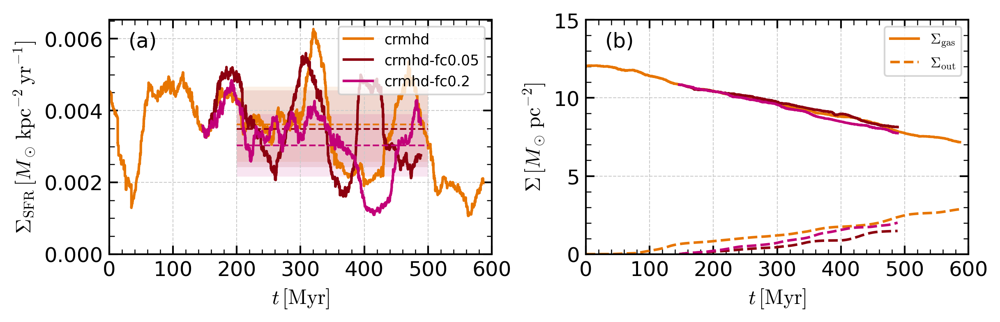

In [12]:
f = ps.plot_history(simgroup,"all",tmin=0,tmax=600)

/tmp/ipykernel_3083880/1507506299.py:4: FutureWarning: The behavior of obj[i:j] with a float-dtype index is deprecated. In a future version, this will be treated as positional instead of label-based. For label-based slicing, use obj.loc[i:j] instead
  plt.boxplot(h["nfofc"][150:250],positions=[i])
/tmp/ipykernel_3083880/1507506299.py:5: FutureWarning: The behavior of obj[i:j] with a float-dtype index is deprecated. In a future version, this will be treated as positional instead of label-based. For label-based slicing, use obj.loc[i:j] instead
  plt.boxplot(h["nbad_d"][150:250],positions=[i+0.2])
/tmp/ipykernel_3083880/1507506299.py:6: FutureWarning: The behavior of obj[i:j] with a float-dtype index is deprecated. In a future version, this will be treated as positional instead of label-based. For label-based slicing, use obj.loc[i:j] instead
  plt.boxplot(h["nbad_p"][150:250],positions=[i+0.4])
/tmp/ipykernel_3083880/1507506299.py:4: FutureWarning: The behavior of obj[i:j] with a float-

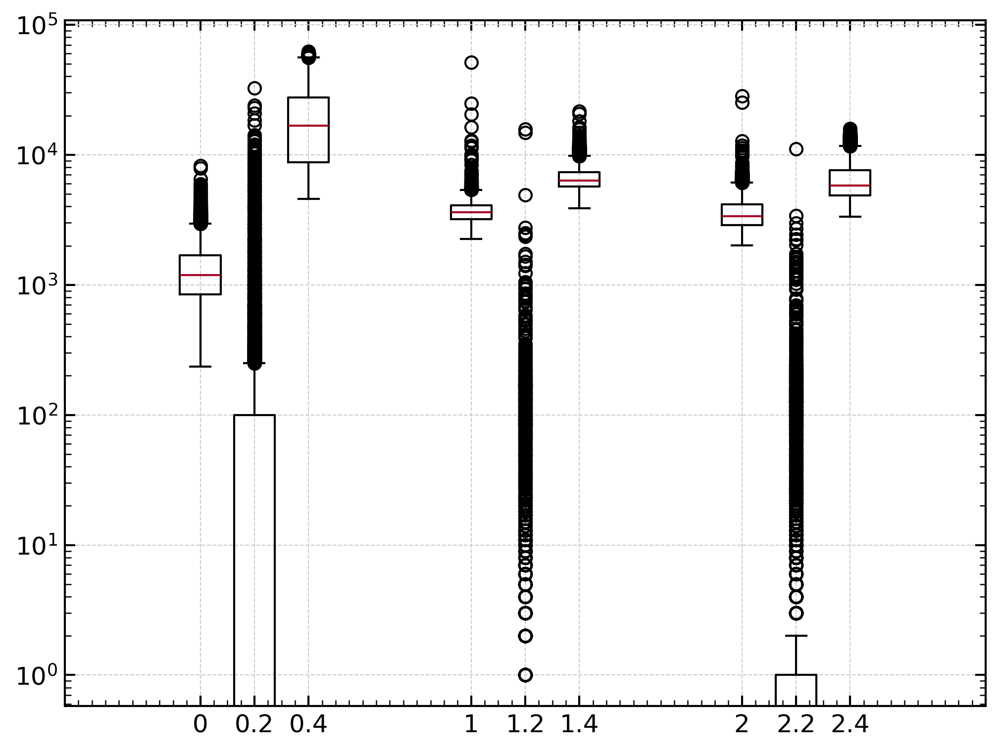

In [17]:
for i,(m, s) in enumerate(simgroup["all"].items()):
    h = s.hst
    # plt.plot(h["time"],h["nfofc"])
    plt.boxplot(h["nfofc"][150:250],positions=[i])
    plt.boxplot(h["nbad_d"][150:250],positions=[i+0.2])
    plt.boxplot(h["nbad_p"][150:250],positions=[i+0.4])
    # plt.xlim(200,210)
    # plt.plot(h["time"],h["nbad_d"])
plt.yscale("log")

/tmp/ipykernel_3083880/2675234172.py:5: FutureWarning: The behavior of obj[i:j] with a float-dtype index is deprecated. In a future version, this will be treated as positional instead of label-based. For label-based slicing, use obj.loc[i:j] instead
  h["nfofc"][160:250].plot()
/tmp/ipykernel_3083880/2675234172.py:5: FutureWarning: The behavior of obj[i:j] with a float-dtype index is deprecated. In a future version, this will be treated as positional instead of label-based. For label-based slicing, use obj.loc[i:j] instead
  h["nfofc"][160:250].plot()
/tmp/ipykernel_3083880/2675234172.py:5: FutureWarning: The behavior of obj[i:j] with a float-dtype index is deprecated. In a future version, this will be treated as positional instead of label-based. For label-based slicing, use obj.loc[i:j] instead
  h["nfofc"][160:250].plot()


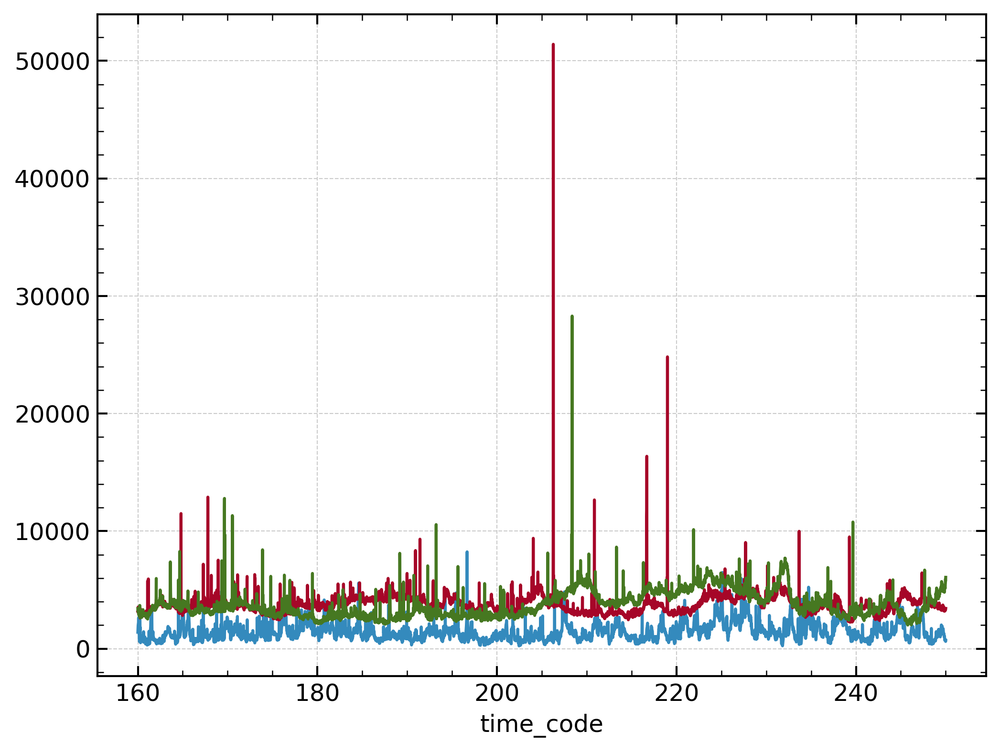

In [18]:
for i,(m, s) in enumerate(simgroup["all"].items()):
    h = s.hst
    # plt.plot(h["time"],h["nfofc"])
    # plt.boxplot(h["mass_added"][160:250],positions=[i])
    h["nfofc"][160:250].plot()
    # plt.xlim(200,210)
    # plt.plot(h["time"],h["nbad_d"])
# plt.yscale("log")

In [38]:
data = s.load_hdf5(num=21,outid=7)

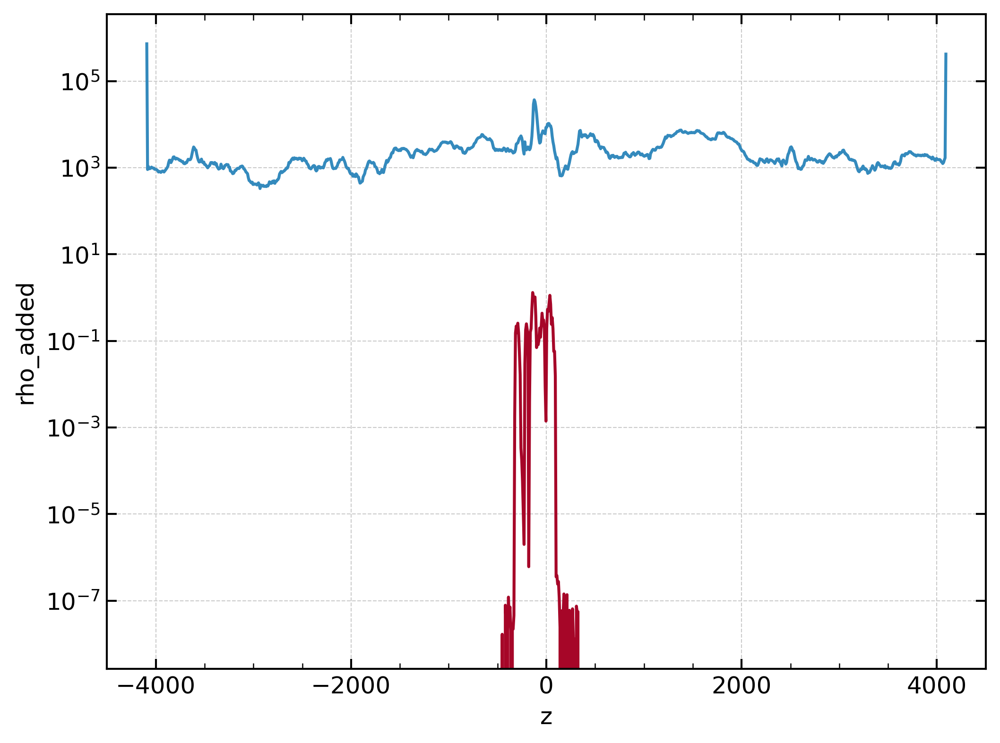

In [44]:
data["fofc"].sum(dim=["x","y"]).plot()
data["rho_added"].sum(dim=["x","y"]).plot()
plt.yscale("log")

In [21]:
ps.fig_outdir

'../fc_figures'

crmhd Pok_cr 11447.018285197293 11532.766419602736
crmhd 660.0215095496768
crmhd Pok_th 3830.9597928144312 3716.928887483648
crmhd 220.88860194687092
crmhd Pok_kin 13687.906445085444 13741.40249825563
crmhd 789.2284653849782
crmhd Pi_B 1295.534924639588 1297.9121495336415
crmhd 74.69900853925387
crmhd-fc0.05 Pok_cr 7978.082720113979 7953.140899437253
crmhd-fc0.05 476.6736556756541
crmhd-fc0.05 Pok_th 3712.276396418094 3607.2811629555545
crmhd-fc0.05 221.80070360736696
crmhd-fc0.05 Pok_kin 14472.886474000145 14291.881983889456
crmhd-fc0.05 864.7245141175745
crmhd-fc0.05 Pi_B 1681.09527625221 1755.5793820908762
crmhd-fc0.05 100.4419055282453
crmhd-fc0.2 Pok_cr 12833.488353405968 12566.546158094214
crmhd-fc0.2 884.6305653442387
crmhd-fc0.2 Pok_th 3386.282551932294 3223.3303749433585
crmhd-fc0.2 233.42126207923593
crmhd-fc0.2 Pok_kin 12459.54838755077 12387.83050521445
crmhd-fc0.2 858.8543528063984
crmhd-fc0.2 Pi_B 865.8795011426145 833.7380632280715
crmhd-fc0.2 59.68630286032001
Model    

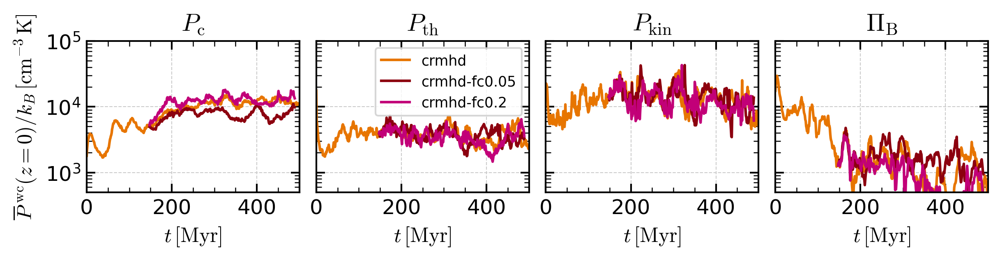

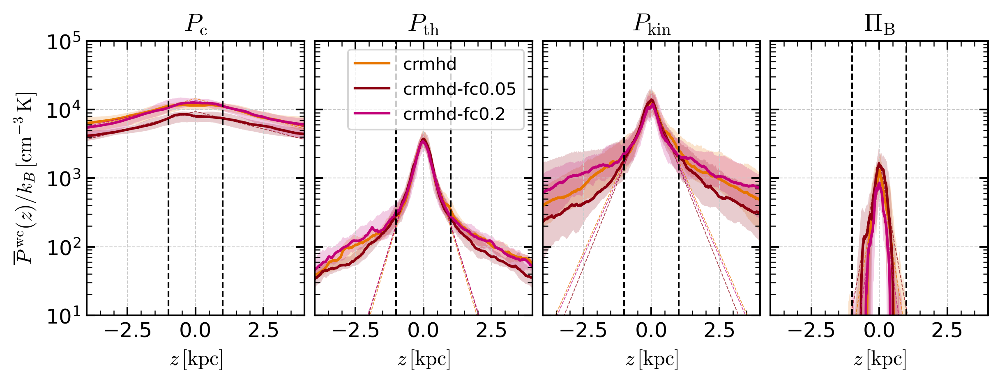

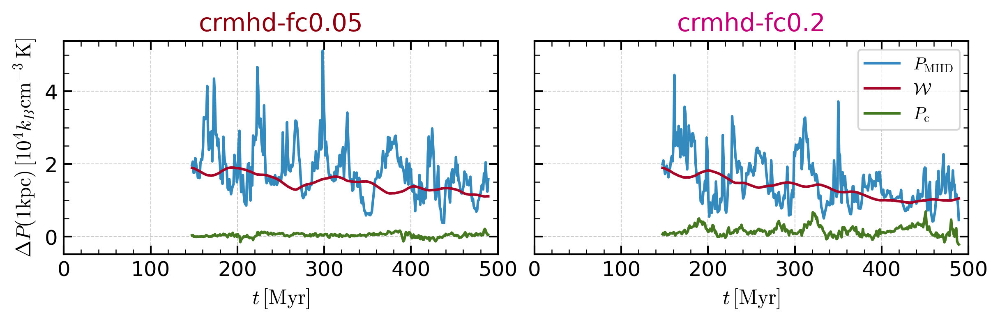

In [13]:
f=ps.plot_pressure_t(simgroup, "all", zslice=slice(-50,50), tmax=500)
f=ps.plot_pressure_z(simgroup, "all")
f=ps.plot_vertical_equilibrium_t(simgroup, group, tmin=0, zmax=1000)

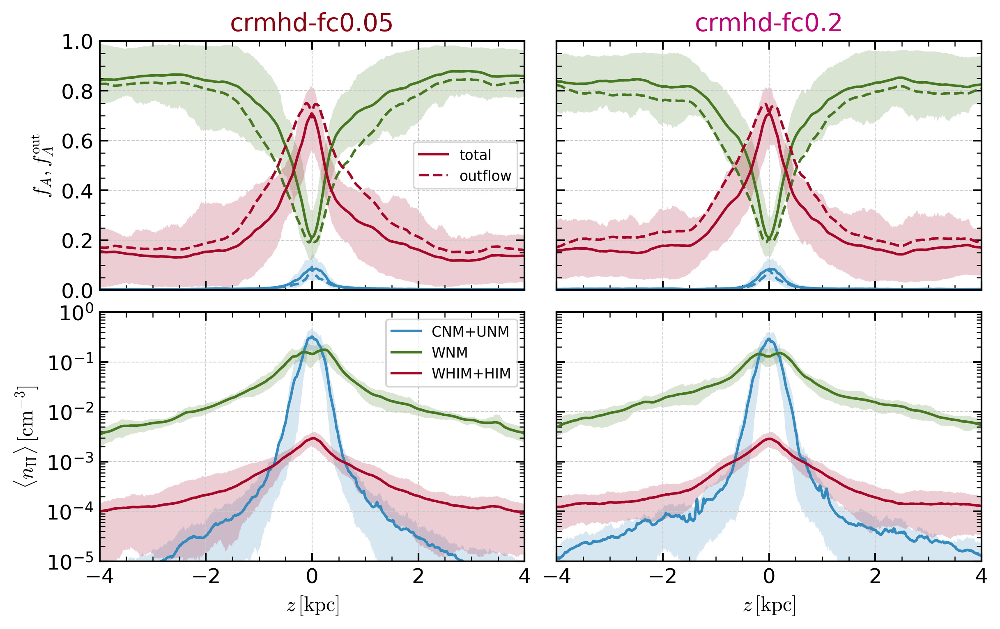

In [14]:
f=ps.plot_area_mass_fraction_z(simgroup, group)

In [15]:
for m, s in simgroup["all"].items():
    if s.options["cosmic_ray"]:
        zp_pp = s.load_zprof_postproc()

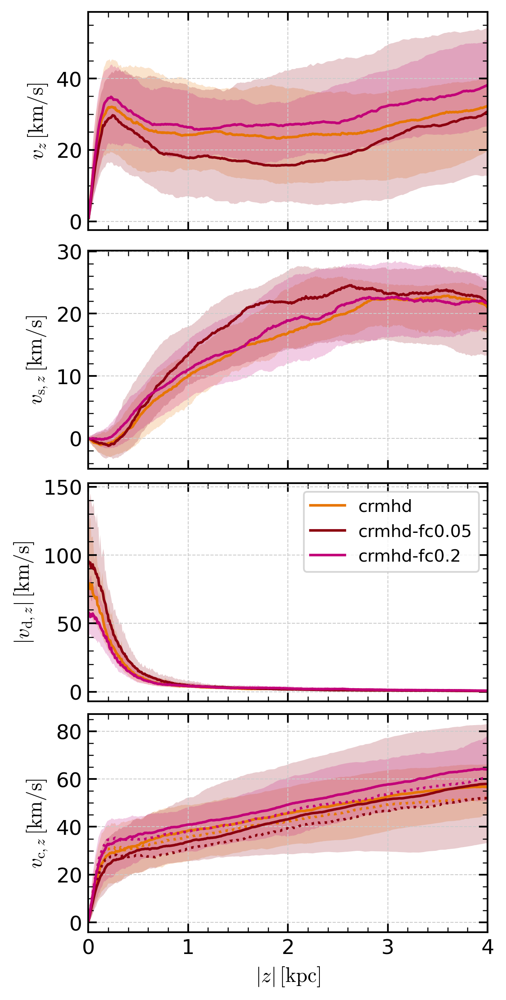

In [16]:
f = ps.plot_cr_velocity_z_all(simgroup, "all")

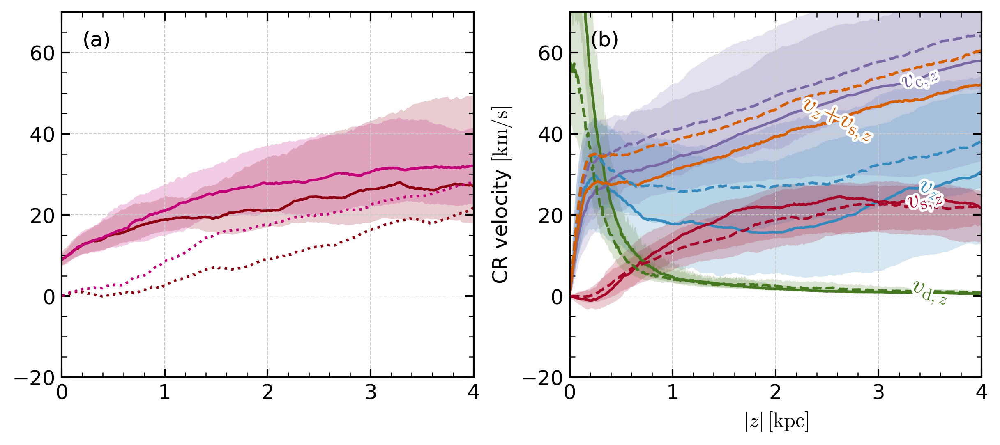

In [22]:
f = ps.plot_cr_velocity_z(simgroup, group, both=True)

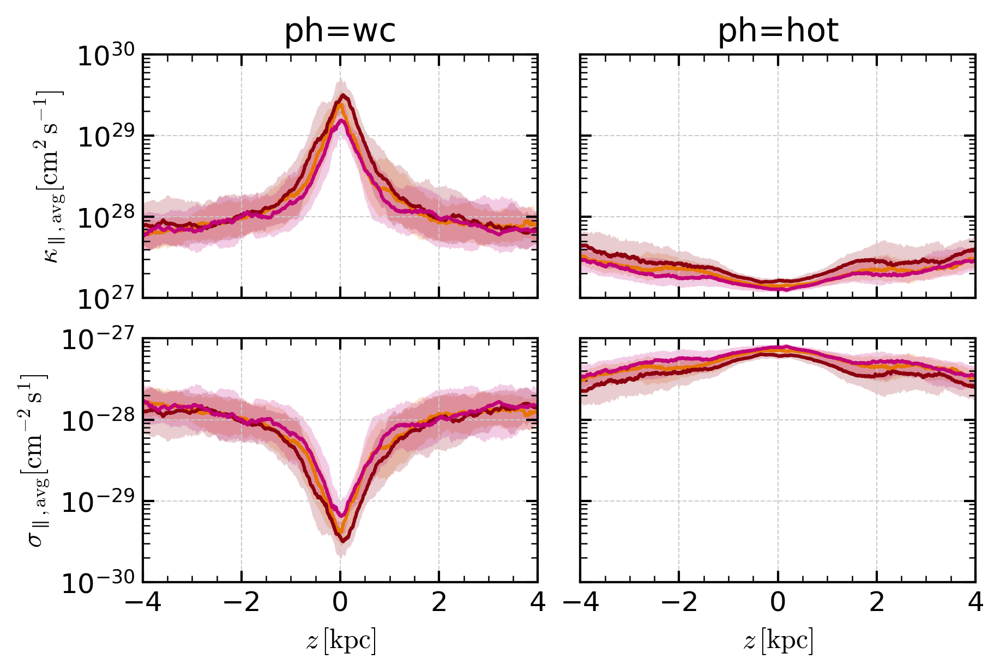

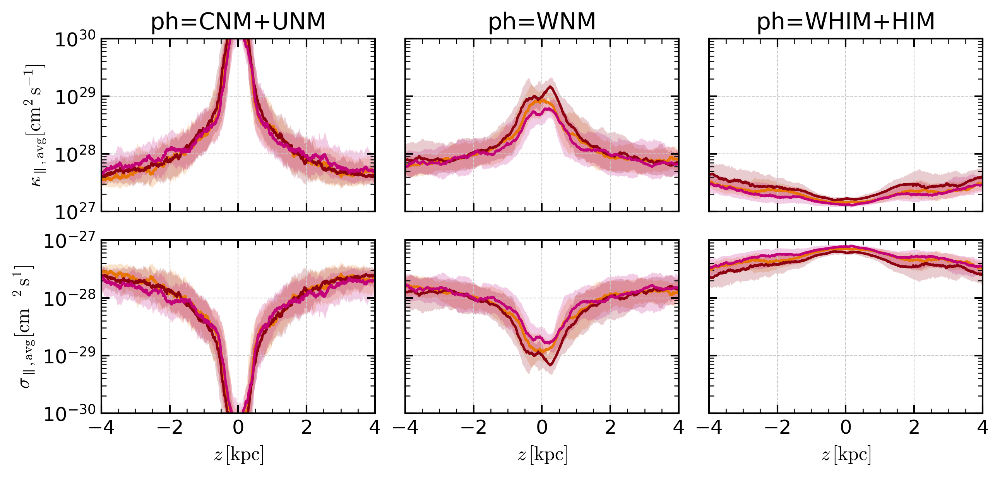

In [17]:
f=ps.plot_kappa_z(simgroup, "all")
f=ps.plot_kappa_z(
    simgroup,
    "all",
    phases=[["CNM", "UNM"], "WNM", ["WHIM", "HIM"]],
)

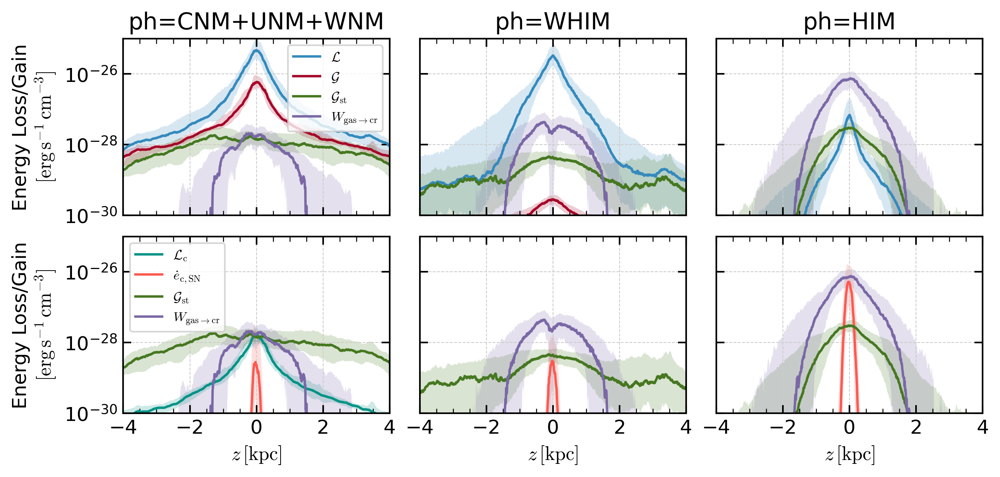

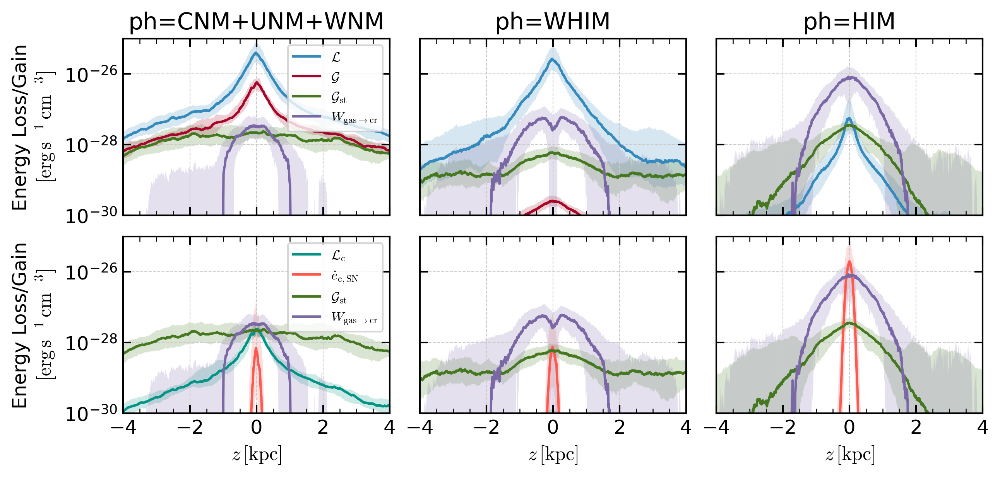

In [18]:
for m, s in simgroup[group].items():
    ps.plot_gainloss_z_each(
        s,
        m,
        phases=[["CNM", "UNM", "WNM"], "WHIM", "HIM"],
    )

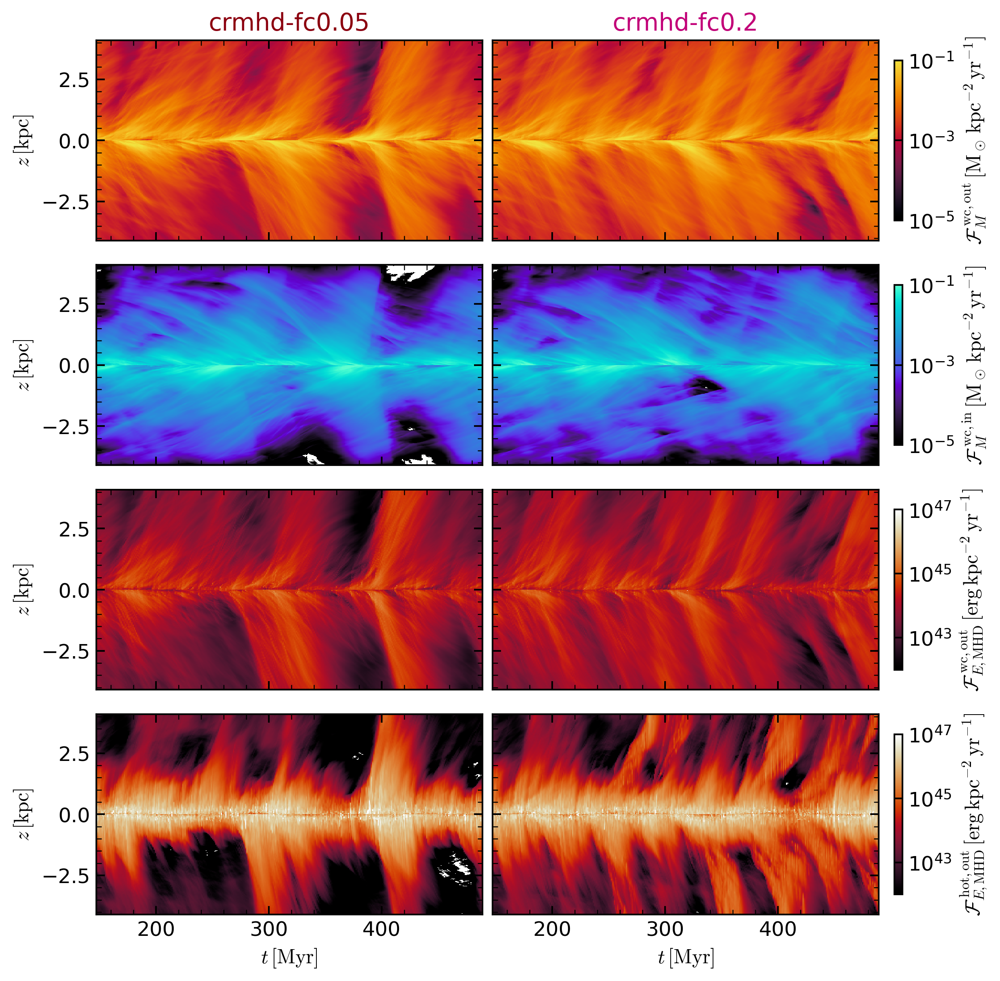

In [19]:
f=ps.plot_flux_tz(simgroup, group)
# f.axes[0].set_xlim(200,500)

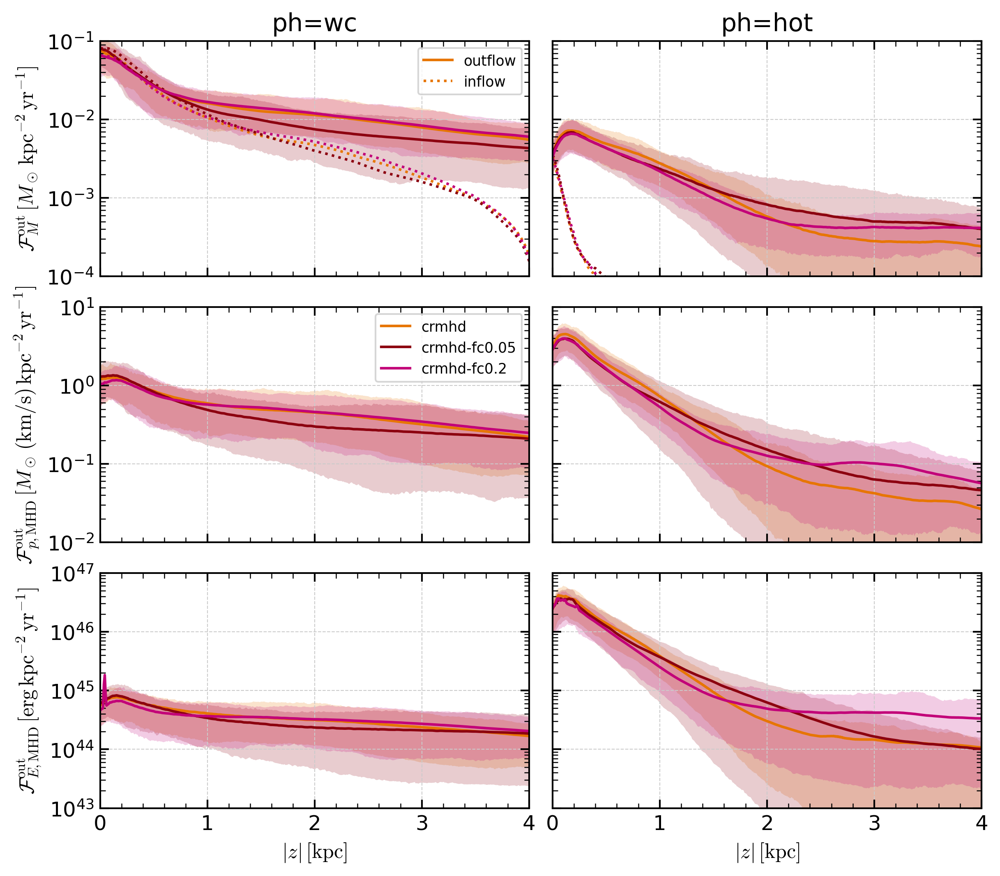

In [20]:
f=ps.plot_flux_z(simgroup, "all", vz_dir=1, both=True)

crmhd ['wc', 'hot'] loading factors at z=[0.5, 1, 2, 3, 4] kpc: eta_M=[2.02224727 2.30682301 2.0011401  1.76274482 1.54367253], eta_p_MHD=[0.70669448 0.32939684 0.13633337 0.08182555 0.05107493], eta_E_MHD=[0.36913047 0.10796348 0.01470456 0.00943772 0.00719071]
crmhd ['wc', 'hot'] loading factors at z=[0.5, 1, 2, 3, 4] kpc: eta_p_CR=[0.84086944 0.89320101 0.76665295 0.62350808 0.54195928], eta_E_CR=[0.26862141 0.33804535 0.34332032 0.31760457 0.29665553]
crmhd-fc0.05 ['wc', 'hot'] loading factors at z=[0.5, 1, 2, 3, 4] kpc: eta_M=[0.60506803 1.17492679 1.23647045 1.2626024  1.30282906], eta_p_MHD=[0.68395312 0.29962939 0.11597013 0.07425411 0.05488702], eta_E_MHD=[0.34179829 0.10603867 0.0221006  0.00974734 0.00772403]
crmhd-fc0.05 ['wc', 'hot'] loading factors at z=[0.5, 1, 2, 3, 4] kpc: eta_p_CR=[0.62366371 0.64056979 0.53559284 0.4485386  0.39069239], eta_E_CR=[0.19745363 0.24339523 0.2535785  0.24481968 0.23694609]
crmhd-fc0.2 ['wc', 'hot'] loading factors at z=[0.5, 1, 2, 3, 4] k

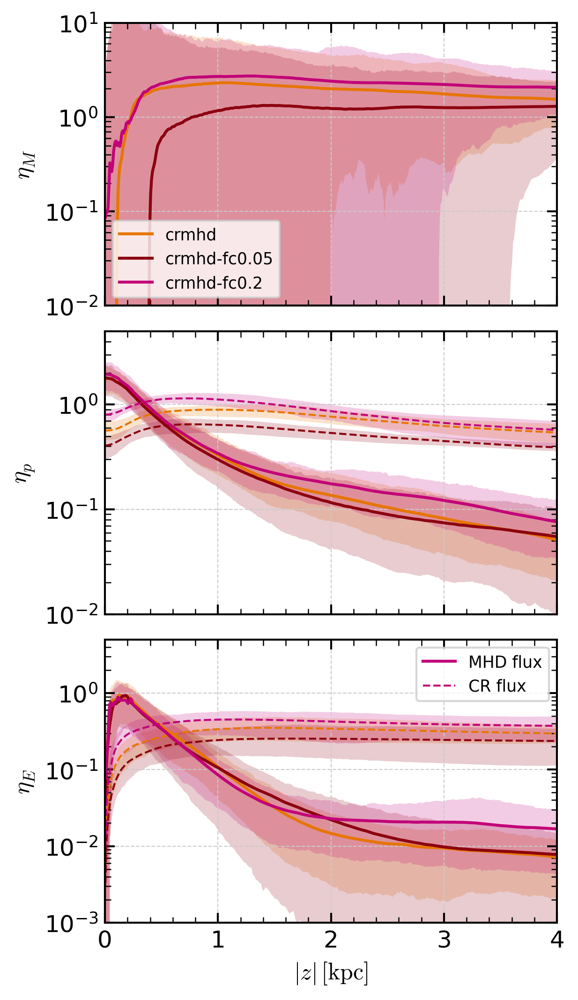

In [21]:
f=ps.plot_loading_z_merged(simgroup, "all", vz_dir=None, both=True)

crmhd 1995.8672936537869
crmhd-fc0.05 1798.6212596587616
crmhd-fc0.2 1960.6126978324914


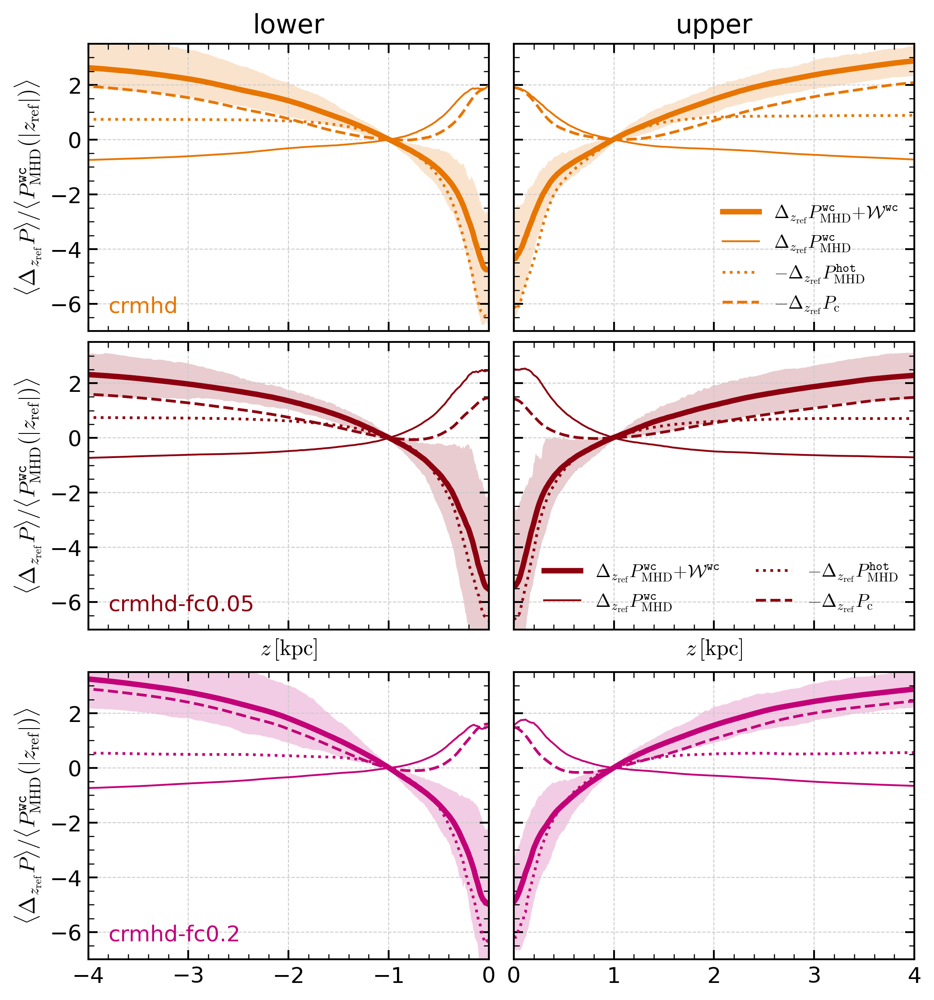

In [23]:
f=ps.plot_momentum_transfer_z(simgroup, "all", show_option=1, zmin=0, zref=1000)
# plt.setp(f.axes,ylim=(-1,3))
# plt.savefig(osp.join(ps.fig_outdir, f"{group}_dflux_1.pdf"))

In [24]:
from cr_zprof import load_windpdf
for m, s in simgroup[group].items():
    load_windpdf(s, both=True)

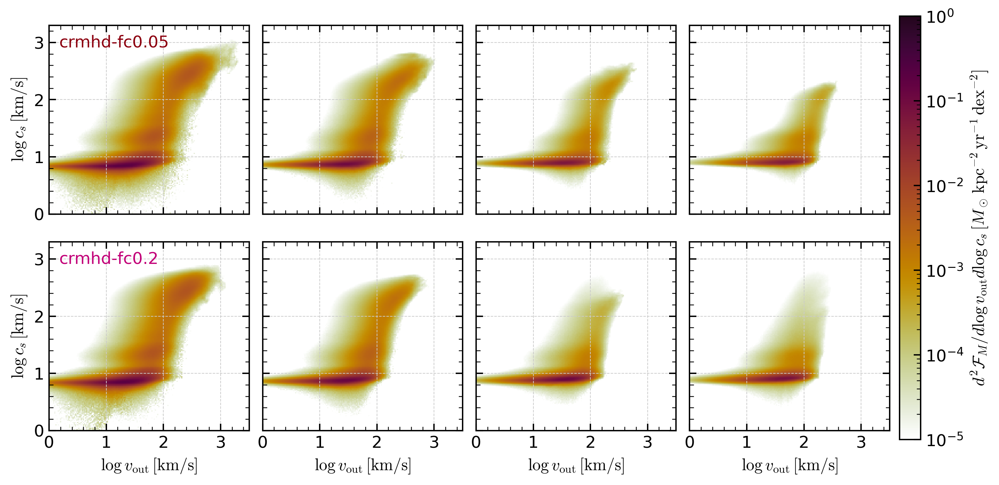

In [25]:
f=ps.plot_jointpdf(simgroup, group)

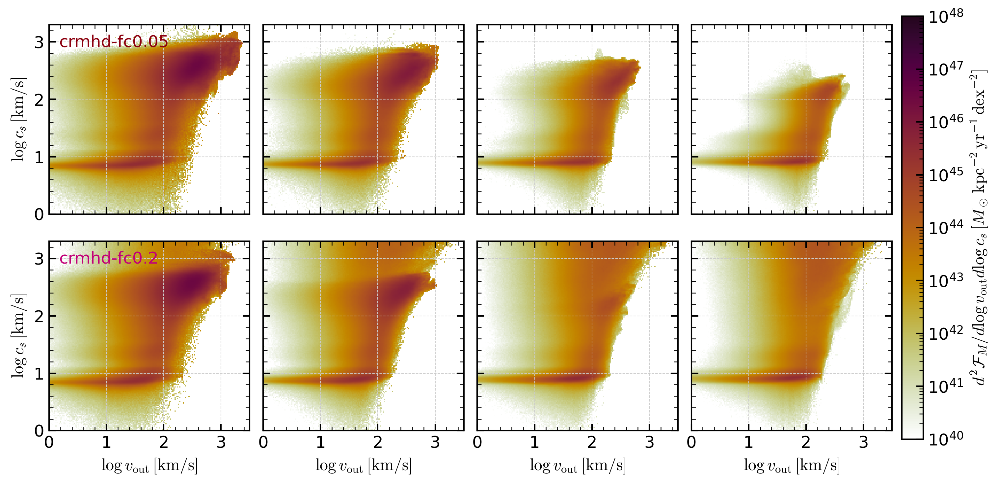

In [26]:
f=ps.plot_jointpdf(simgroup, group, flux="eflux")

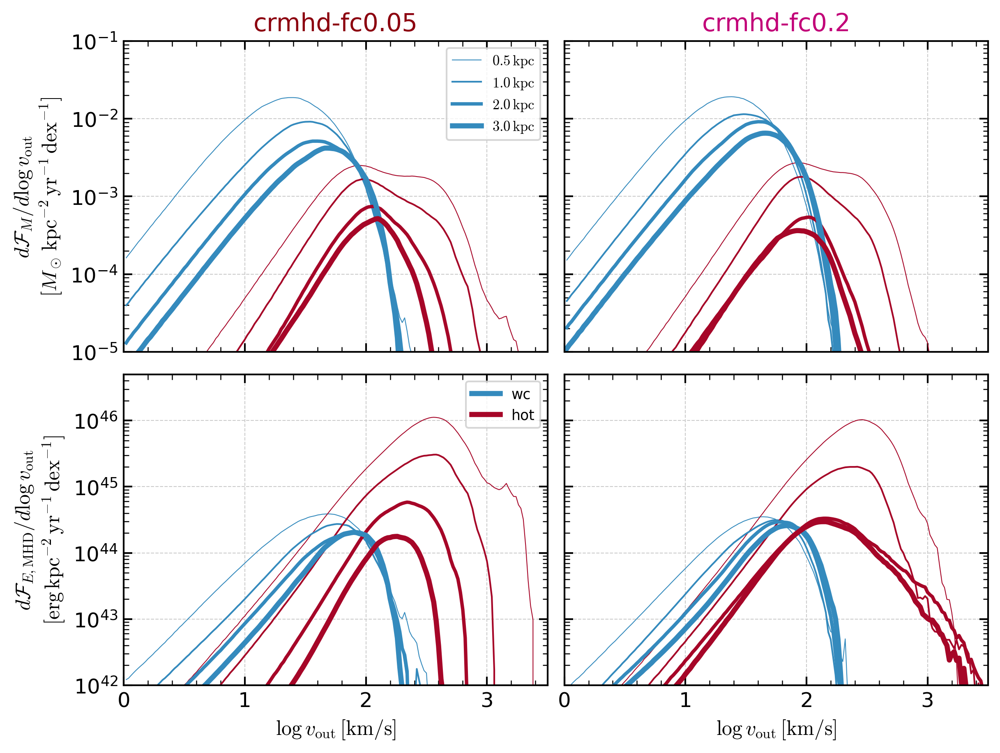

In [27]:
f=ps.plot_voutpdf(simgroup, group)

sinj 0.00012728863546482072
$F_{\rm in,W}$ 0.19378222291652542 0.2757792074773163
$F_{\rm in,SN}$ 0.10778722136743137 0.10778723549827986
$G_{\rm st}$ 0.013947947401524557 0.023501827119960423
$L_{\rm coll}$ 0.0030702896118213643 0.003694662398894659
$F_{\rm out}$ 0.2686214062862485 0.33827870977772384
$F_{\rm in}$ 0.2845512072706105 0.356369953456741
sinj 0.00012283799747662925
$F_{\rm in,W}$ 0.16523731392950014 0.2223556970319326
$F_{\rm in,SN}$ 0.05426202672335568 0.05426208103782347
$G_{\rm st}$ 0.0114774860209536 0.01921962575994647
$L_{\rm coll}$ 0.0024655137562273753 0.0029521190525043967
$F_{\rm out}$ 0.19745362628255506 0.24358992842371793
$F_{\rm in}$ 0.2055563408756748 0.2544460332573051
sinj 0.00010647266470912996
$F_{\rm in,W}$ 0.2262800244459385 0.3049466054558284
$F_{\rm in,SN}$ 0.23369773223750878 0.23369794014220335
$G_{\rm st}$ 0.016900708337557035 0.028575035739510587
$L_{\rm coll}$ 0.0038432689286088647 0.004687650245785998
$F_{\rm out}$ 0.39780298314104956 0.451026

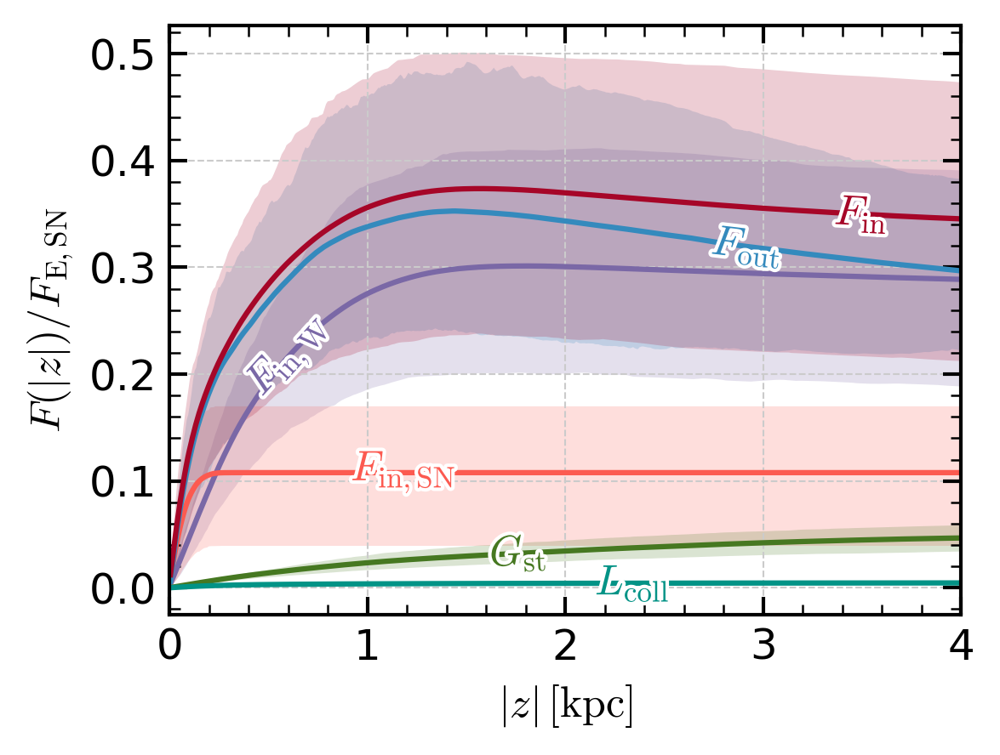

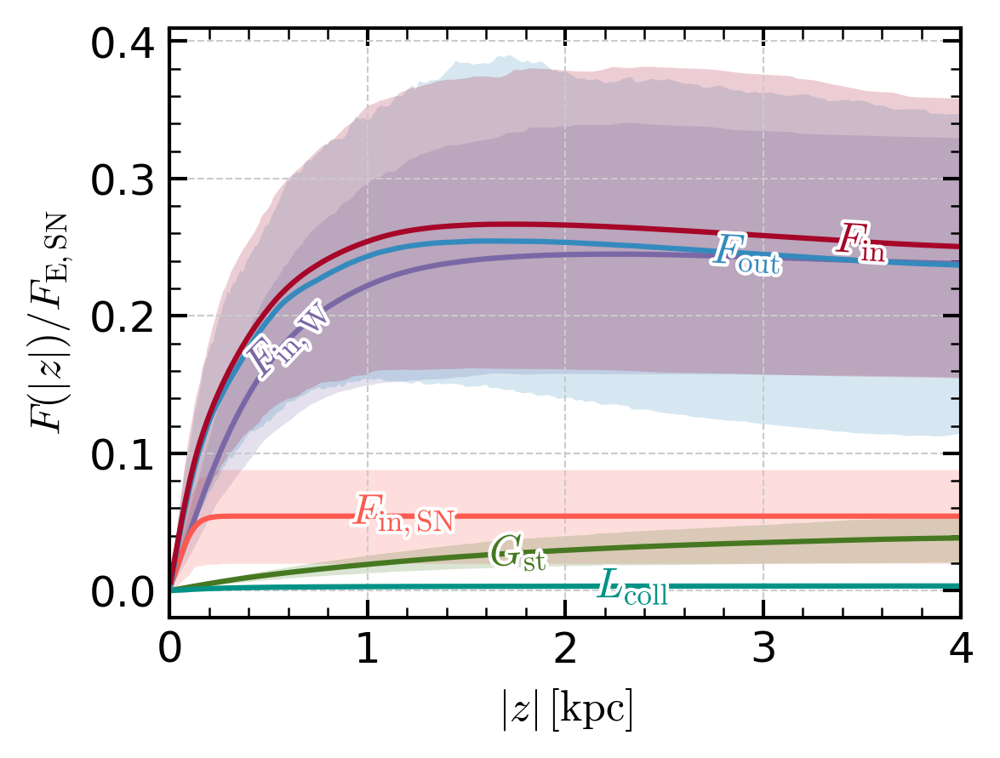

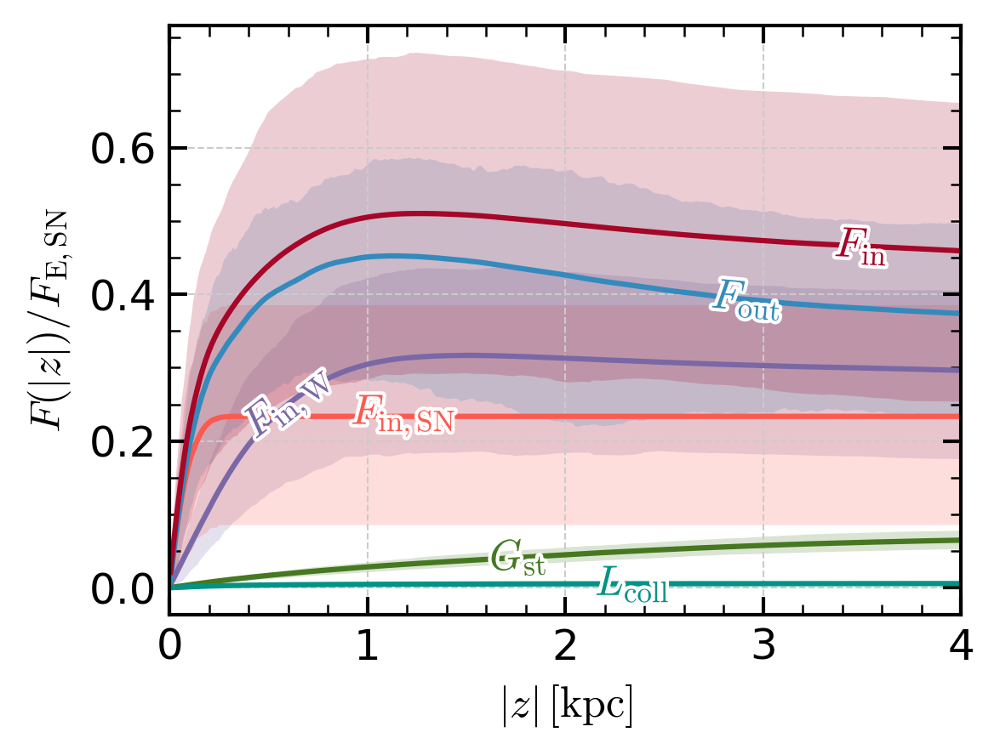

In [28]:
for m, s in simgroup["all"].items():
    if s.options["cosmic_ray"]:
        ps.plot_crgain_cumsum(s, m)

        # # will not be used in the paper, but just for checking
        # load_velocity_pdfs(s, xf="T")
        # load_kappa_pdfs(s, xf="T", yf="sigma_para")
        # ps.plot_velocity_T(s, m)

/home/changgoo/.conda/envs/pyathena/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/home/changgoo/.conda/envs/pyathena/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/home/changgoo/.conda/envs/pyathena/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/home/changgoo/.conda/envs/pyathena/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/home/changgoo/.conda/envs/pyathena/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/home/changgoo/.conda/envs/pyathena/lib/python3.12/site-packages/labellines/core.py:181: UserWarning: Tried to label line Line2D(_

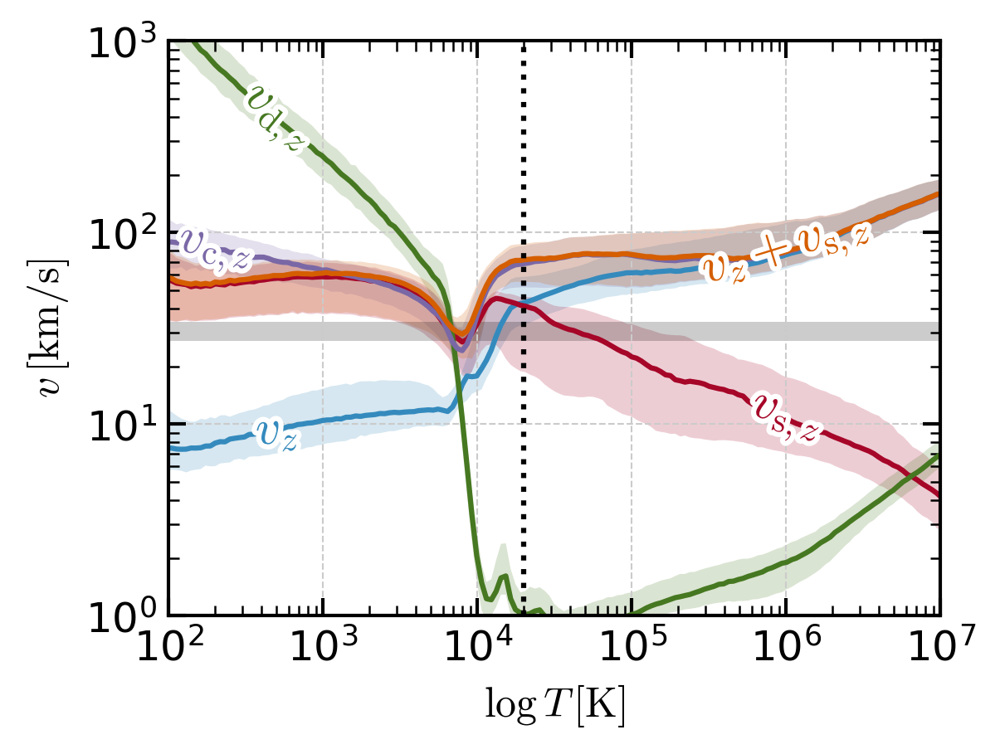

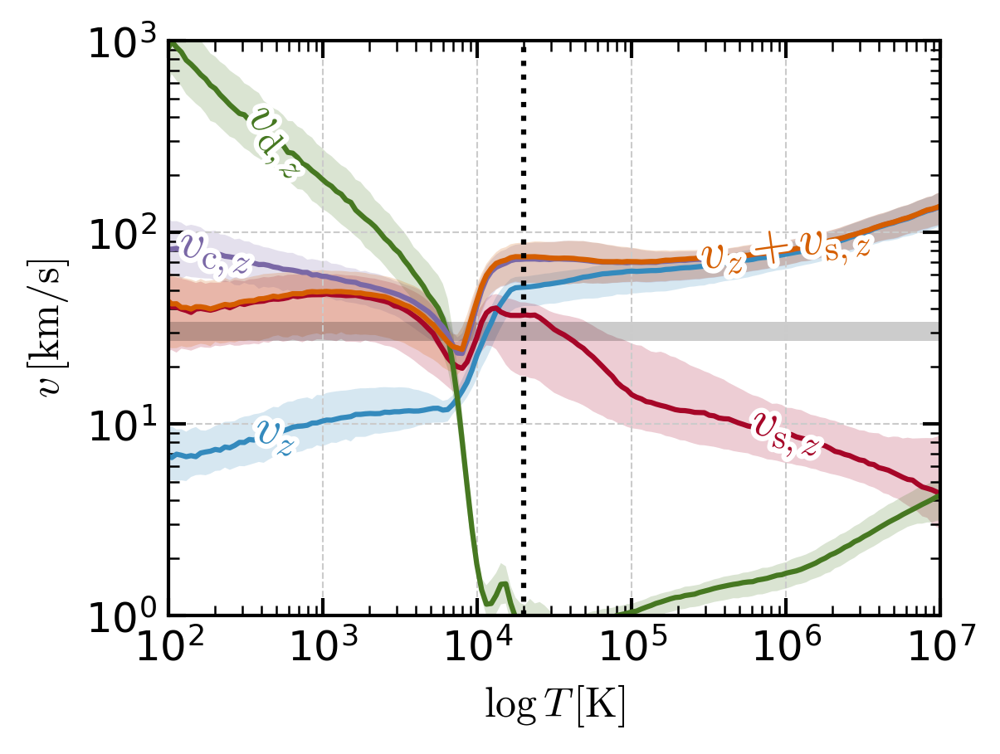

In [39]:
from cr_zprof import load_velocity_pdfs, load_kappa_pdfs
for m, s in simgroup[group].items():
    if s.options["cosmic_ray"]:
        # will not be used in the paper, but just for checking
        load_velocity_pdfs(s, xf="T")
        load_kappa_pdfs(s, xf="T", yf="sigma_para")
        ps.plot_velocity_T(s, m)

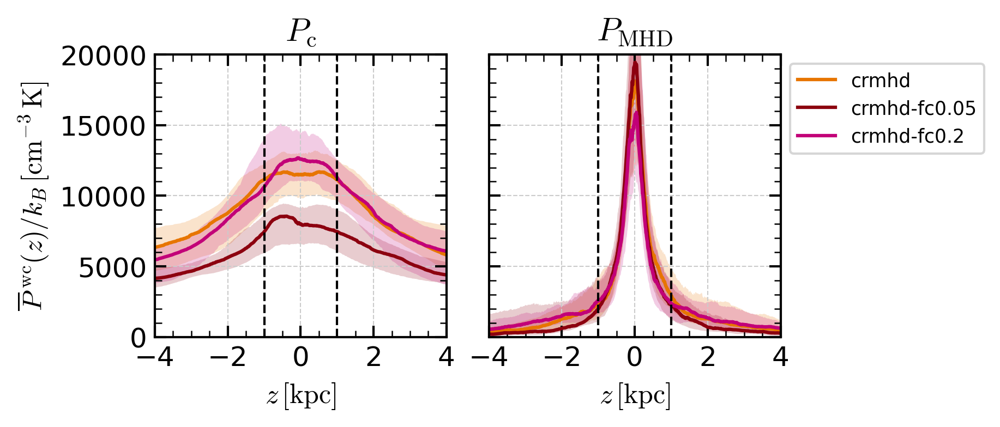

In [37]:
f = ps.plot_pressure_z_talk(simgroup,"all")
plt.setp(f.axes,"ylim",(0,2e4))
f.axes[1].legend(fontsize="x-small", bbox_to_anchor=(1,1))
plt.savefig(os.path.join(ps.fig_outdir, f"all_pressures_z_talk_lin.pdf"))

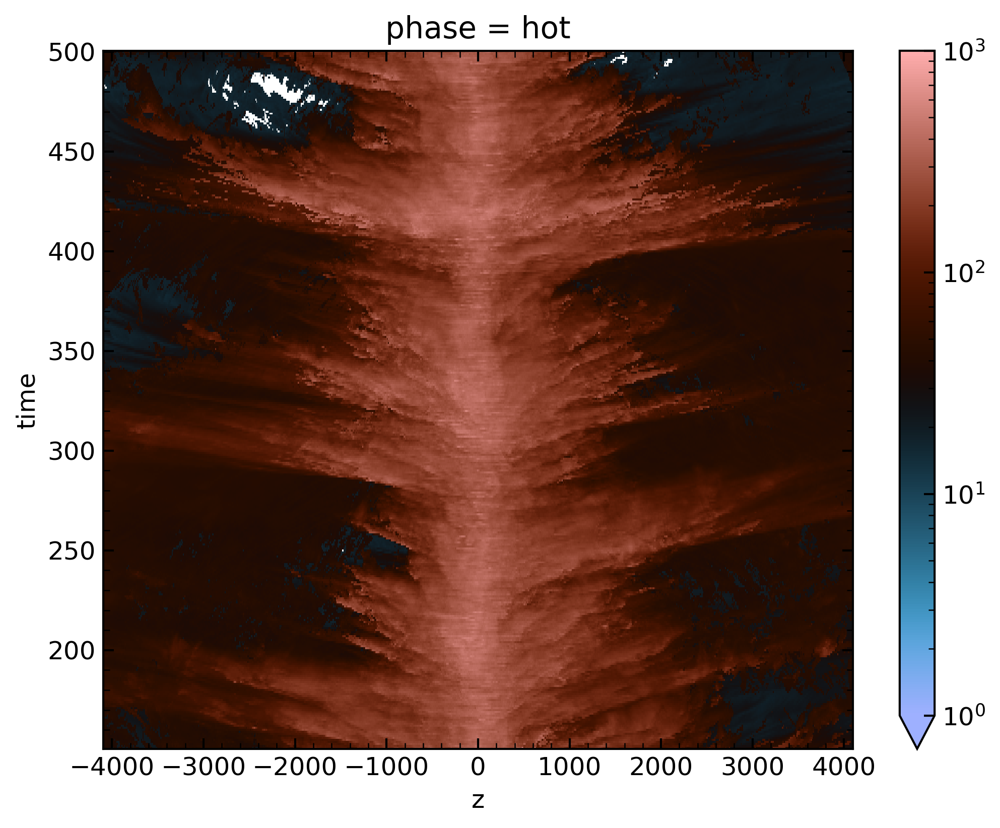

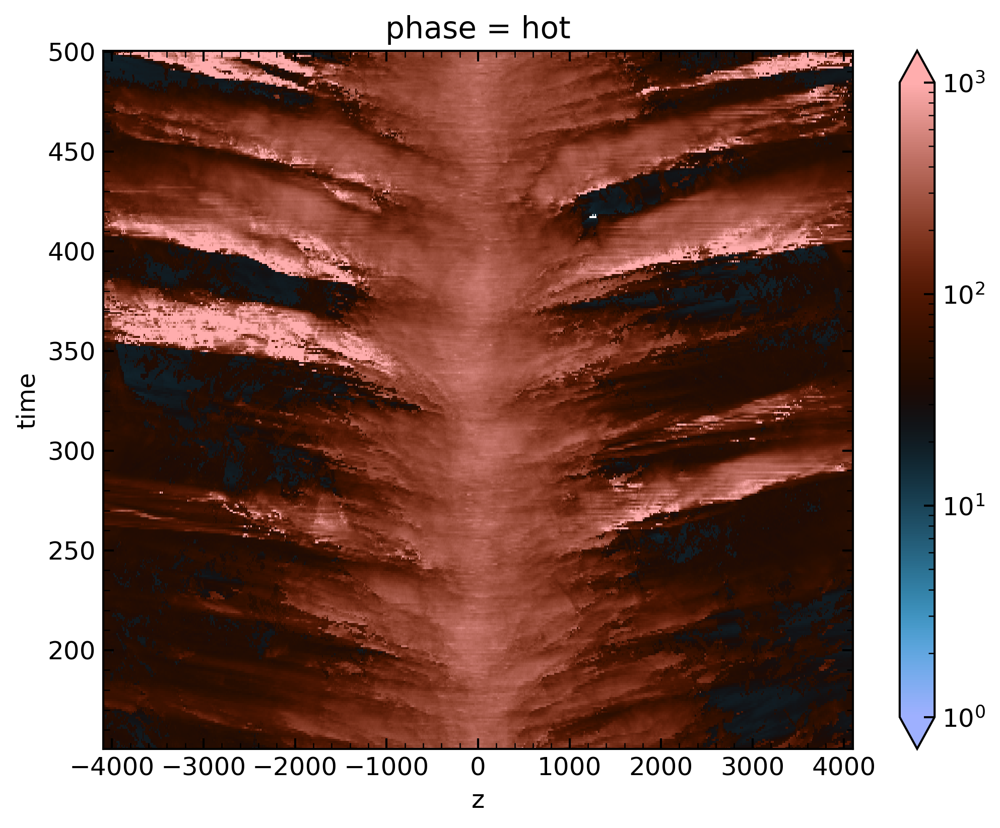

In [29]:
for m, s in simgroup[group].items():
    plt.figure()
    np.sqrt(s.zp_ph["press"]/s.zp_ph["rho"]).sum(dim="vz_dir").sel(phase="hot").plot(norm=LogNorm(1.0,1.e3), cmap=plt.cm.berlin)

In [43]:
np.linspace(-4000,4000,9)

array([-4000., -3000., -2000., -1000.,     0.,  1000.,  2000.,  3000.,
        4000.])

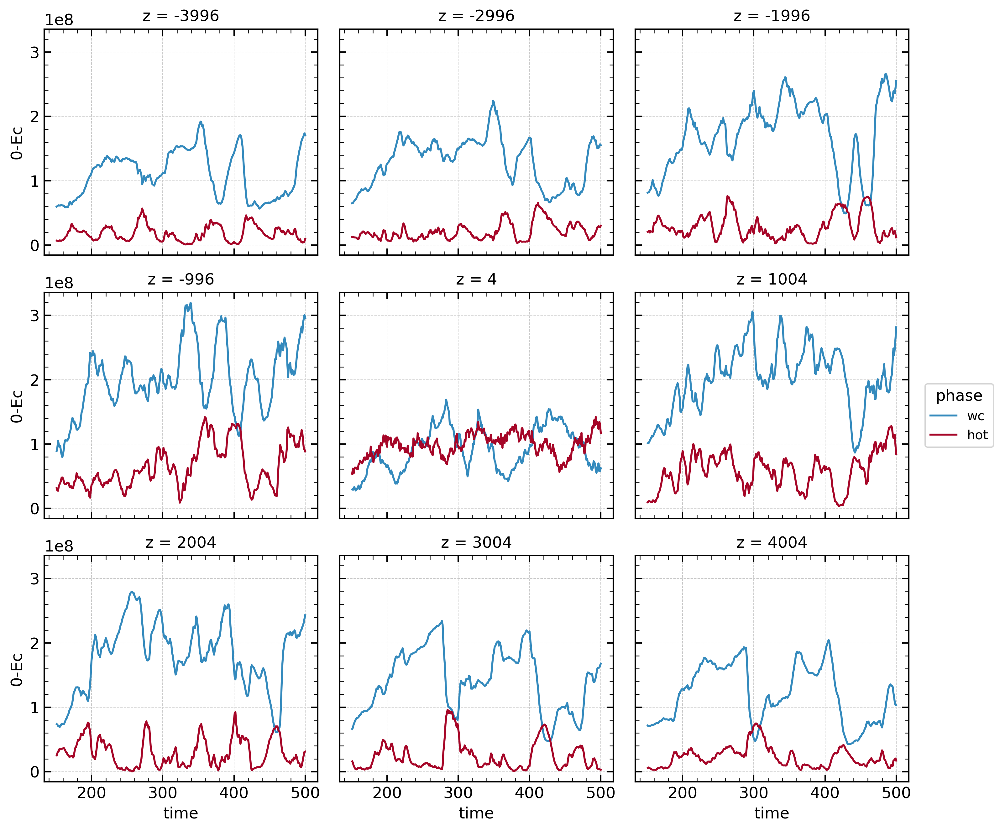

In [45]:
s.zp_ph["0-Ec"].sum(dim="vz_dir").sel(z=np.linspace(-4000,4000,9),method="nearest").plot(hue="phase",col="z",col_wrap=3)

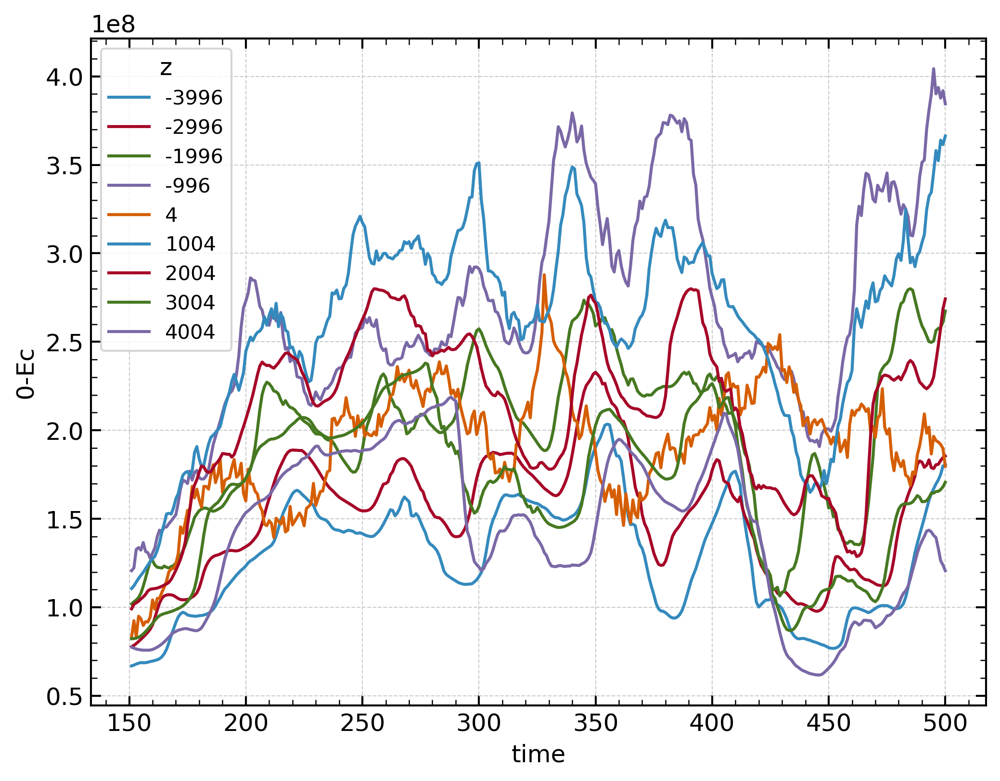

In [46]:
s.zp_ph["0-Ec"].sum(dim=["vz_dir","phase"]).sel(z=np.linspace(-4000,4000,9),method="nearest").plot(hue="z")

<Axes: xlabel='time_code'>

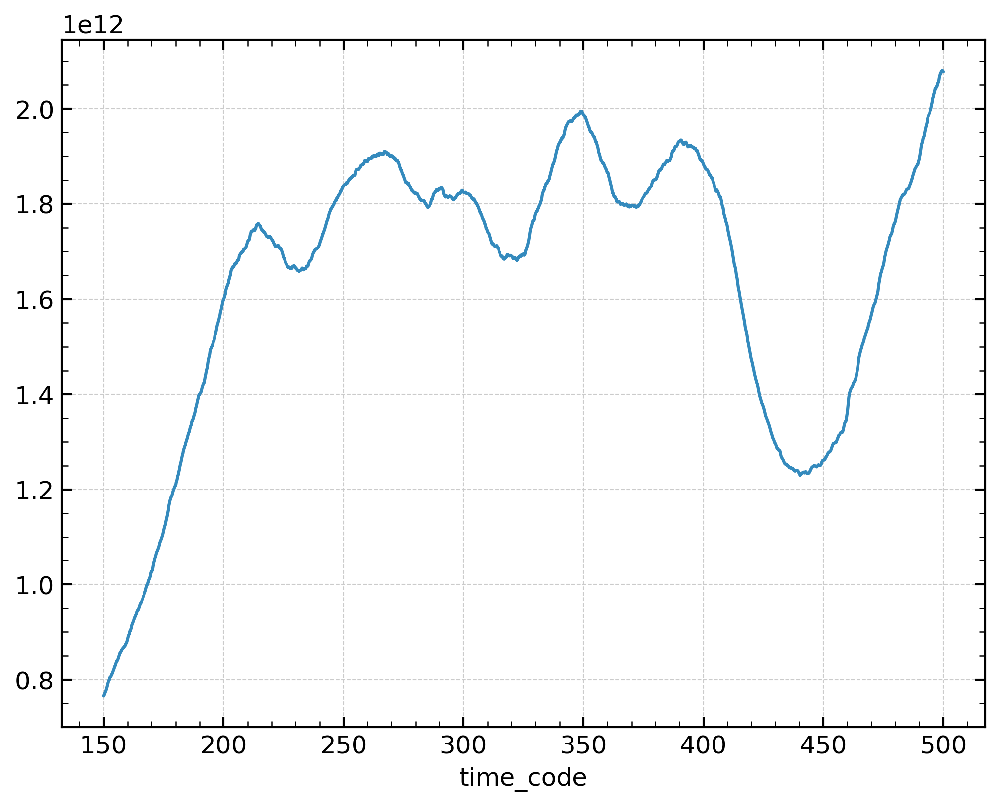

In [51]:
s.hst["0Ec"].plot()

In [54]:
s.tslice

slice(204.542433009139, 511.3560825228475, None)

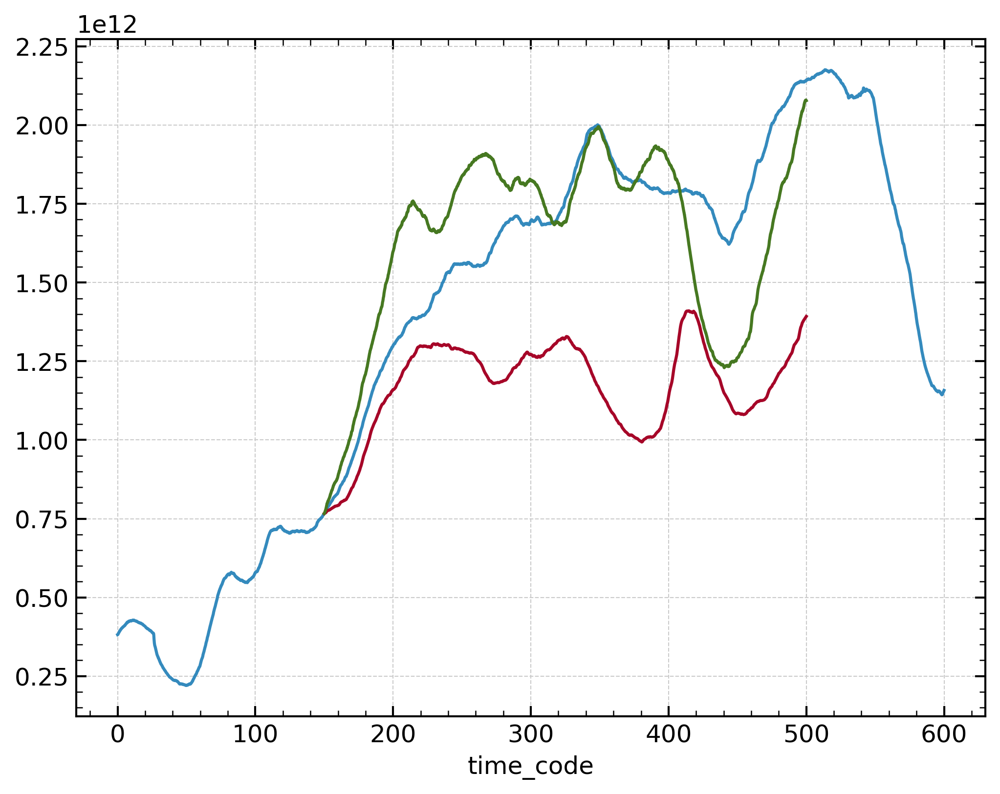

In [53]:
for m, s in simgroup["all"].items():
    s.hst["0Ec"].plot()